# Proyek Analisis Data: Air Quality
- **Nama:** Muhammad Rafsanjani
- **Email:** muhammadrafsanjani5@gmail.com
- **ID Dicoding:** 

## Menentukan Pertanyaan Bisnis
- Bagaimana penyebaran PM2.5 pada station yang ada?
- Bagaimana penyebaran PM10 pada station yang ada?
- Bagaimana penyebaran PM2.5 pada setiap musim?
- Bagaimana pengaruh SO2 terhadap suhu lingkungan?

## Import Semua Packages/Library yang Digunakan

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Data Wrangling

### Gathering Data

In [2]:
df_Aotizhongxin = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Aotizhongxin_20130301-20170228.csv')
df_Changping = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Changping_20130301-20170228.csv')
df_Dingling = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv')
df_Dongsi = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Dongsi_20130301-20170228.csv')
df_Guanyuan = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Guanyuan_20130301-20170228.csv')
df_Gucheng = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Gucheng_20130301-20170228.csv')
df_Huairou = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Huairou_20130301-20170228.csv')
df_Nongzhanguan = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Nongzhanguan_20130301-20170228.csv')
df_Shunyi = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Shunyi_20130301-20170228.csv')
df_Tiantan = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Tiantan_20130301-20170228.csv')
df_Wanliu = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Wanliu_20130301-20170228.csv')
df_Wanshouxigong = pd.read_csv('Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Wanshouxigong_20130301-20170228.csv')

In [3]:
# concat dataframe

df_all = pd.concat([df_Aotizhongxin, df_Changping, df_Dingling, df_Dongsi, df_Guanyuan, df_Gucheng, df_Huairou, df_Nongzhanguan, df_Shunyi, df_Tiantan, df_Wanliu, df_Wanshouxigong])

### Assessing Data

In [4]:
df_all.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,3,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,4,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,5,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


### Cleaning Data

In [5]:
df_all.isna().sum()

No             0
year           0
month          0
day            0
hour           0
PM2.5       8739
PM10        6449
SO2         9021
NO2        12116
CO         20701
O3         13277
TEMP         398
PRES         393
DEWP         403
RAIN         390
wd          1822
WSPM         318
station        0
dtype: int64

In [6]:
df_all = df_all.drop(columns=['No'])


#### Create Missing values imputation Function

In [7]:
def missing_values_imputation(dataframe, column):
    df_groupby_column = dataframe.groupby(by='station')[column].mean().reset_index()
    
    Aotizhongxin =  df_groupby_column.iloc[0][column]
    Changping =  df_groupby_column.iloc[1][column]
    Dingling =  df_groupby_column.iloc[2][column]
    Dongsi =  df_groupby_column.iloc[3][column]
    Guanyuan =  df_groupby_column.iloc[4][column]
    Gucheng =  df_groupby_column.iloc[5][column]
    Huairou =  df_groupby_column.iloc[6][column]
    Nongzhanguan =  df_groupby_column.iloc[7][column]
    Shunyi =  df_groupby_column.iloc[8][column]
    Tiantan =  df_groupby_column.iloc[9][column]
    Wanliu =  df_groupby_column.iloc[10][column]
    Wanshouxigong =  df_groupby_column.iloc[11][column]
    
    df_null = dataframe[dataframe[column].isna()]
    df_not_null = dataframe[dataframe[column].notna()]

    data_impute = []

    for i in df_null['station']:
        if i == 'Aotizhongxin':
            data_impute.append(Aotizhongxin)
        elif i == 'Changping':
            data_impute.append(Changping)
        elif i == 'Dingling':
            data_impute.append(Dingling)
        elif i == 'Dongsi':
            data_impute.append(Dongsi)
        elif i == 'Guanyuan':
            data_impute.append(Guanyuan)
        elif i == 'Gucheng':
            data_impute.append(Gucheng)
        elif i == 'Huairou':
            data_impute.append(Huairou)
        elif i == 'Nongzhanguan':
            data_impute.append(Nongzhanguan)
        elif i == 'Shunyi':
            data_impute.append(Shunyi)
        elif i == 'Tiantan':
            data_impute.append(Tiantan)
        elif i == 'Wanliu':
            data_impute.append(Wanliu)
        elif i == 'Wanshouxigong':
            data_impute.append(Wanshouxigong)

    df_null[column] = data_impute

    dataframe = pd.concat([df_not_null, df_null]).reset_index(drop=True)

    return dataframe

#### Missing Values Imputation

In [8]:
df_all = missing_values_imputation(df_all, 'PM2.5')
df_all = missing_values_imputation(df_all, 'PM10')
df_all = missing_values_imputation(df_all, 'SO2')
df_all = missing_values_imputation(df_all, 'NO2')
df_all = missing_values_imputation(df_all, 'CO')
df_all = missing_values_imputation(df_all, 'O3')
df_all = missing_values_imputation(df_all, 'TEMP')
df_all = missing_values_imputation(df_all, 'PRES')
df_all = missing_values_imputation(df_all, 'DEWP')
df_all = missing_values_imputation(df_all, 'RAIN')
df_all = missing_values_imputation(df_all, 'WSPM')

#### Missing Values Imputation wd


In [9]:
df_all.groupby(by='station')['wd'].agg(pd.Series.mode).reset_index()

,station,wd
0,Aotizhongxin,NE
1,Changping,NNW
2,Dingling,NNW
3,Dongsi,ENE
4,Guanyuan,NE
5,Gucheng,N
6,Huairou,NW
7,Nongzhanguan,ENE
8,Shunyi,NNE
9,Tiantan,ENE


In [10]:
df_null = df_all[df_all['wd'].isna()]
df_not_null = df_all[df_all['wd'].notna()]

In [11]:
data_impute = []

for i in df_null['station']:
    if i == 'Aotizhongxin':
        data_impute.append('NE')
    elif i == 'Changping':
        data_impute.append('NNW')
    elif i == 'Dingling':
        data_impute.append('NNW')
    elif i == 'Dongsi':
        data_impute.append('ENE')
    elif i == 'Guanyuan':
        data_impute.append('NE')
    elif i == 'Gucheng':
        data_impute.append('N')
    elif i == 'Huairou':
        data_impute.append('NW')
    elif i == 'Nongzhanguan':
        data_impute.append('ENE')
    elif i == 'Shunyi':
        data_impute.append('NNE')
    elif i == 'Tiantan':
        data_impute.append('ENE')
    elif i == 'Wanliu':
        data_impute.append('NE')
    elif i == 'Wanshouxigong':
        data_impute.append('NE')

df_null['wd'] = data_impute

In [12]:
df_all = pd.concat([df_not_null, df_null]).reset_index(drop=True)

#### Grouping Data Based On year, month, day and station


In [13]:
df_grouping = df_all.groupby(by=['year', 'month','day','station'])[['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']].mean().reset_index()

#### Make New Date Column


In [14]:
df_grouping['date'] =  pd.to_datetime(df_grouping[['year', 'month', 'day']])

#### Drop year, month, day, column

In [15]:
df_grouping = df_grouping.drop(columns=['year', 'month','day'])

## Exploratory Data Analysis (EDA)

### Correlation Heat Map Plot

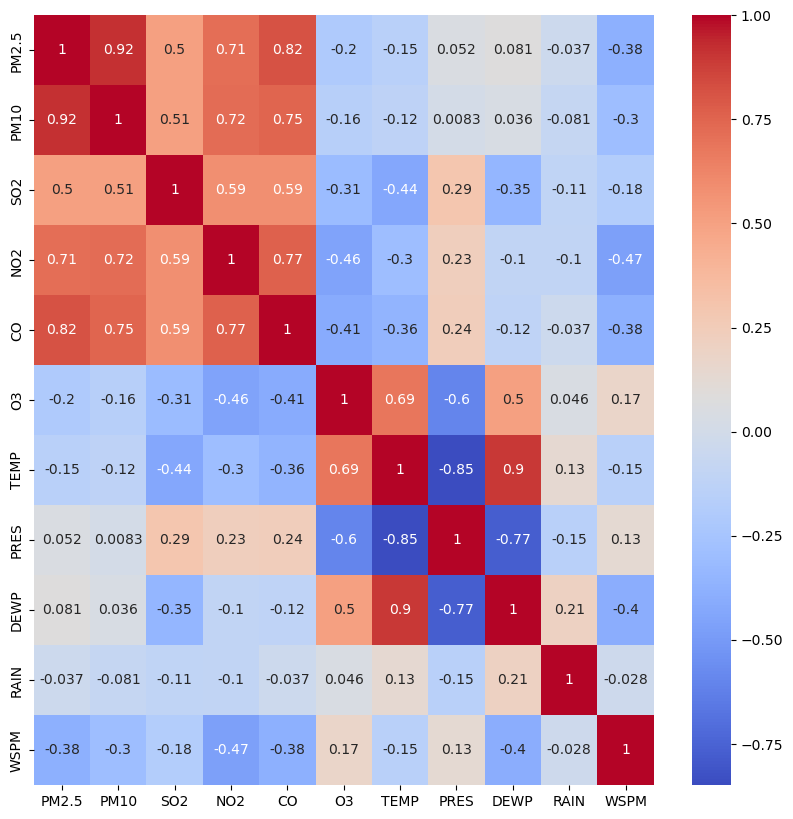

In [16]:
plt.figure(figsize=(10,10))
sns.heatmap(df_grouping.drop(columns=['station', 'date']).corr(), cmap='coolwarm', annot=True) 
plt.show()

### Distrbution Plot 



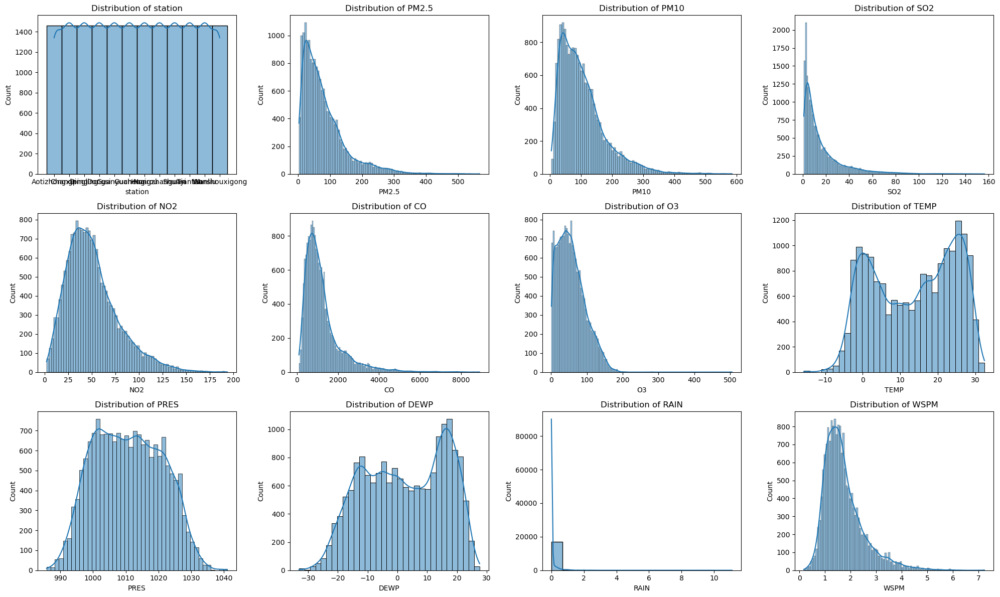

In [17]:
fig, axes = plt.subplots(3,4, figsize=(20,12))
row = 0
col = 0

for i in df_grouping.drop(columns=['date']):
    if col < 4:
        sns.histplot(data=df_grouping.drop(columns=['date']), x=i, kde=True, ax=axes[row][col])
        axes[row][col].set_title(f'Distribution of {i}')
        col+=1
    else:
        col = 0
        row+=1
        sns.histplot(data=df_grouping.drop(columns=['date']), x=i, kde=True, ax=axes[row][col])
        axes[row][col].set_title(f'Distribution of {i}')
        col+=1
plt.tight_layout()
plt.show()

### Box Plot 


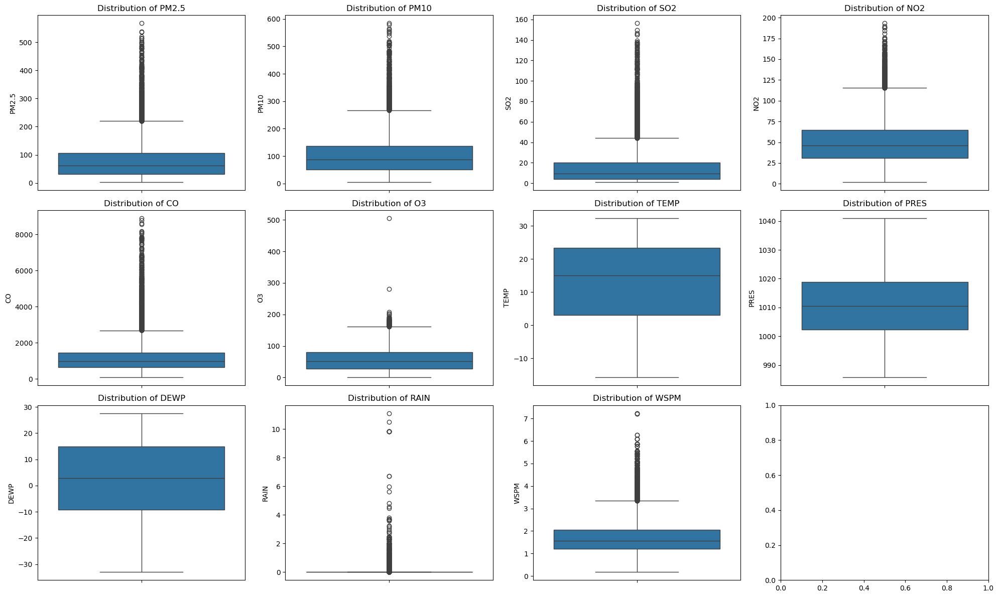

In [18]:
fig, axes = plt.subplots(3,4, figsize=(20,12))
row = 0
col = 0

for i in df_grouping.drop(columns=['station', 'date']):
    if col < 4:
        sns.boxplot(data=df_grouping.drop(columns=['station', 'date']), y=i, ax=axes[row][col])
        axes[row][col].set_title(f'Distribution of {i}')
        col+=1
    else:
        col = 0
        row+=1
        sns.boxplot(data=df_grouping.drop(columns=['station', 'date']), y=i, ax=axes[row][col])
        axes[row][col].set_title(f'Distribution of {i}')
        col+=1
plt.tight_layout()
plt.show()

### Desctitive Statistics

In [19]:
df_grouping.drop(columns=['station', 'date']).describe()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000,17532.000000
mean,79.780235,104.578547,15.820683,50.583319,1230.625090,57.349235,13.538931,1010.746341,2.490654,0.064475,1.729701
std,67.971811,73.395166,17.970441,27.550291,941.699380,37.893758,10.819017,10.261098,13.523383,0.331493,0.779487
min,3.000000,4.833333,1.000000,2.000000,100.000000,1.000000,-15.683333,985.787500,-33.020833,0.000000,0.170833
25%,31.166667,49.791667,4.078118,30.958333,637.500000,27.261906,3.035417,1002.329167,-9.187500,0.000000,1.195833
50%,61.349525,87.958333,9.169921,45.943872,975.000000,52.076817,15.012500,1010.518750,2.764583,0.000000,1.558333
75%,106.730389,136.843750,20.126423,64.725978,1458.333333,80.918861,23.475000,1018.905208,14.995833,0.000000,2.058333
max,567.416667,584.666667,156.416667,193.333333,8904.166667,505.383777,32.366667,1041.025000,27.616667,11.108333,7.237500


### Time Series Analysis


In [20]:
df_Aotizhongxin_Changping_Dingling_Dongsi = df_grouping[(df_grouping['station'] == 'Aotizhongxin') | (df_grouping['station'] == 'Changping') | (df_grouping['station'] == 'Dingling') | (df_grouping['station'] == 'Dongsi')]
df_Guanyuan_Gucheng_Huairou_Nongzhanguan = df_grouping[(df_grouping['station'] == 'Guanyuan') | (df_grouping['station'] == 'Gucheng') | (df_grouping['station'] == 'Huairou') | (df_grouping['station'] == 'Nongzhanguan')]
df_Shunyi_Tiantan_Wanliu_Wanshouxigong = df_grouping[(df_grouping['station'] == 'Shunyi') | (df_grouping['station'] == 'Tiantan') | (df_grouping['station'] == 'Wanliu') | (df_grouping['station'] == 'Wanshouxigong')]

In [21]:
df_merge = {
    "Aotizhongxin_Changping_Dingling_Dongsi" : df_Aotizhongxin_Changping_Dingling_Dongsi,
    "Guanyuan_Gucheng_Huairou_Nongzhanguan" : df_Guanyuan_Gucheng_Huairou_Nongzhanguan,
    "Shunyi_Tiantan_Wanliu_Wanshouxigong" : df_Shunyi_Tiantan_Wanliu_Wanshouxigong
}

Fungsi yang berfungsi menampilkan line plot

In [22]:
def create_line_plot(df, column, title):
    plt.figure(figsize=(25,4))
    sns.lineplot(data=df, x='date', y = column , hue='station')
    plt.title(title)
    plt.show()

#### PM2.5

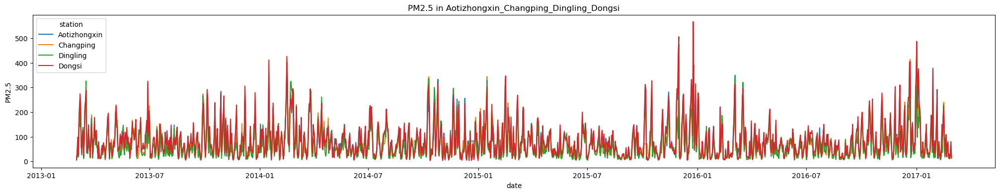

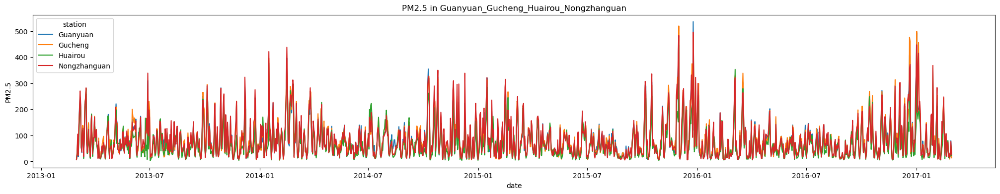

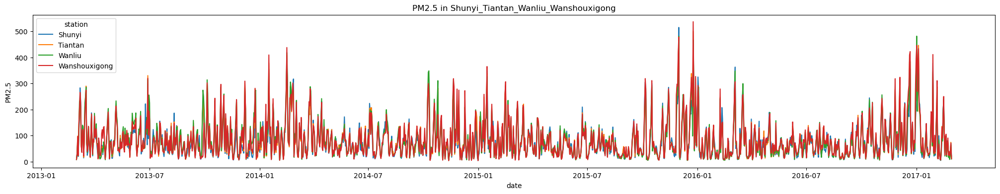

In [23]:
for key in df_merge:
    create_line_plot(df_merge[key], 'PM2.5', f'PM2.5 in {key}')

#### PM10

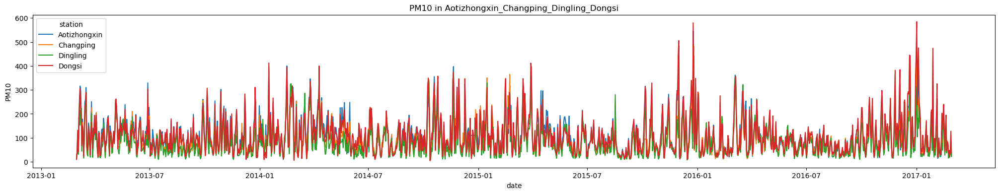

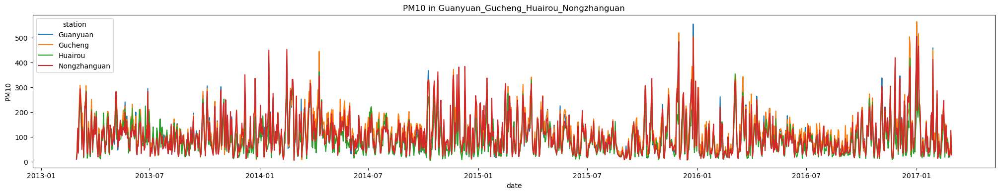

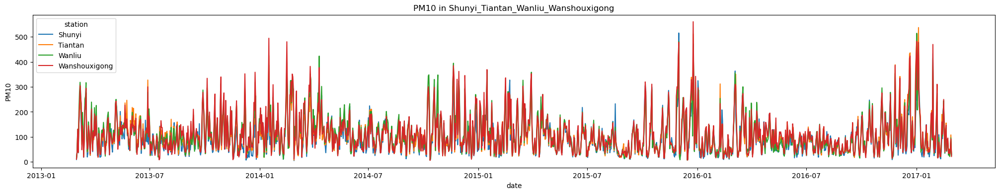

In [24]:
for key in df_merge:
    create_line_plot(df_merge[key], 'PM10', f'PM10 in {key}')

#### SO2

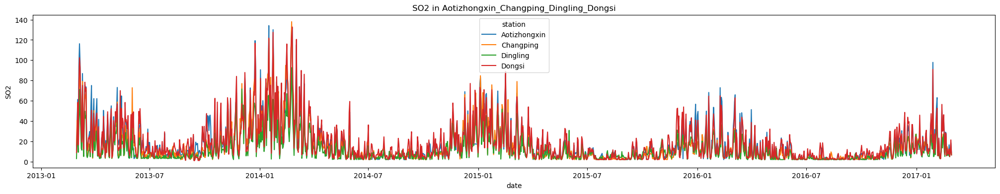

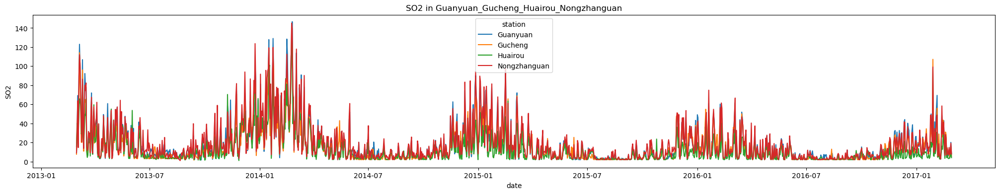

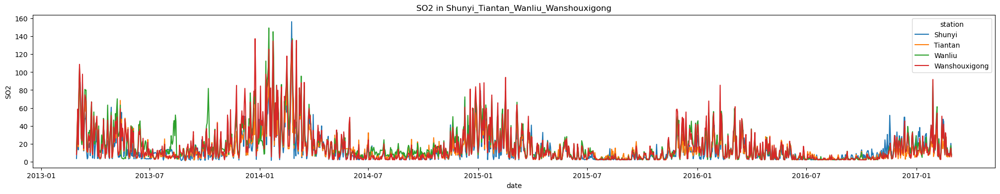

In [25]:
for key in df_merge:
    create_line_plot(df_merge[key], 'SO2', f'SO2 in {key}')

#### NO2

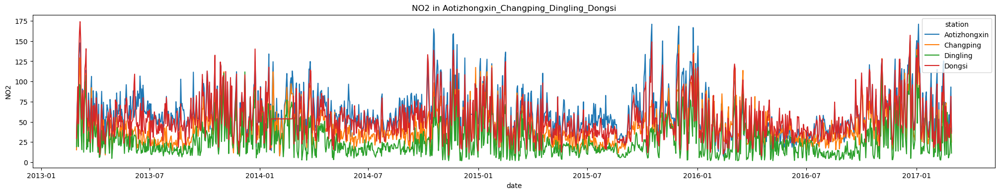

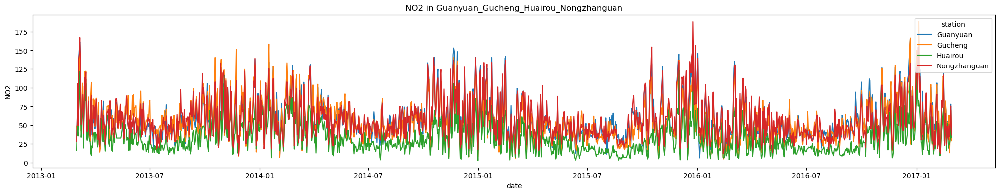

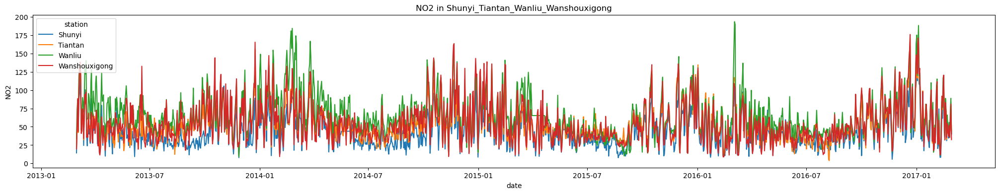

In [26]:
for key in df_merge:
    create_line_plot(df_merge[key], 'NO2', f'NO2 in {key}')

#### CO

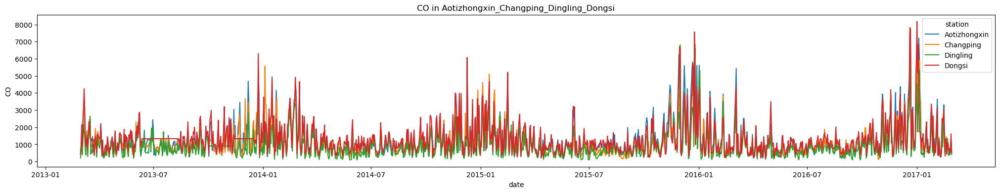

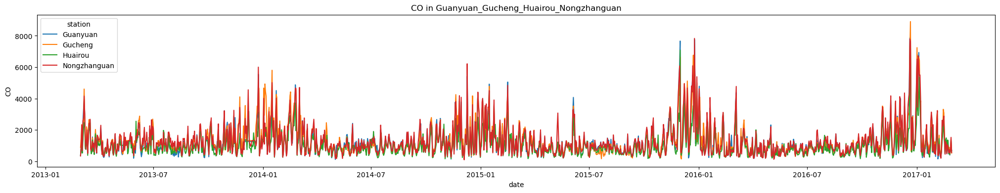

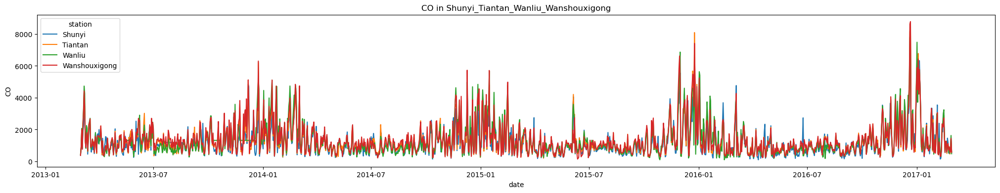

In [27]:
for key in df_merge:
    create_line_plot(df_merge[key], 'CO', f'CO in {key}')

#### O3

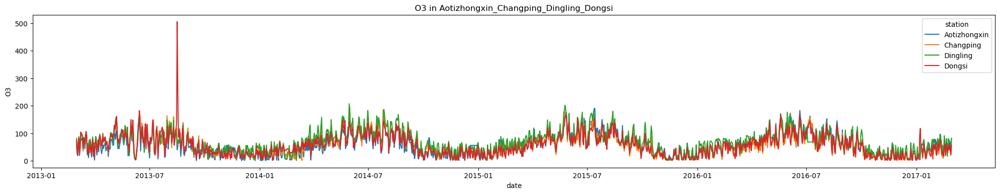

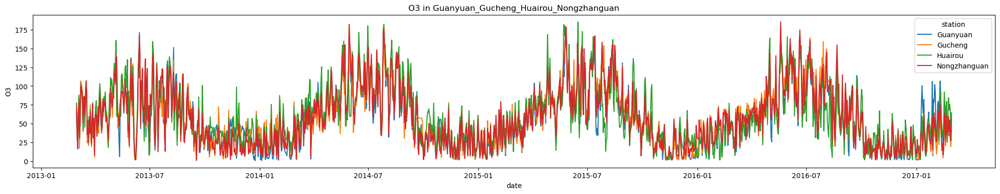

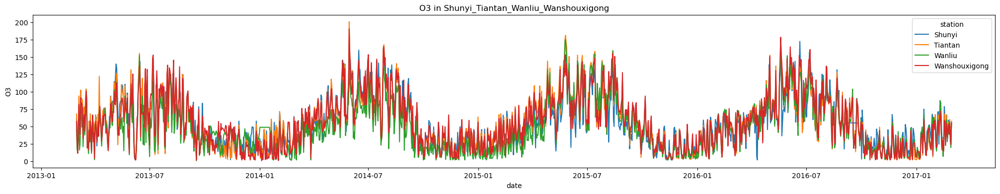

In [28]:
for key in df_merge:
    create_line_plot(df_merge[key], 'O3', f'O3 in {key}')

#### TEMP

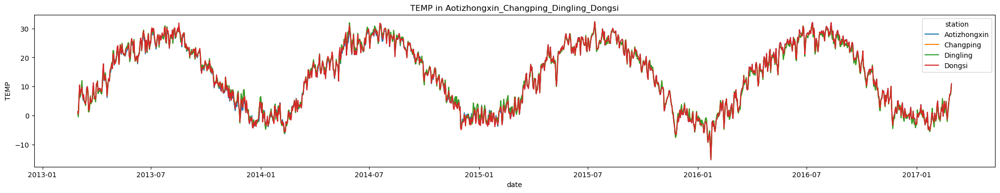

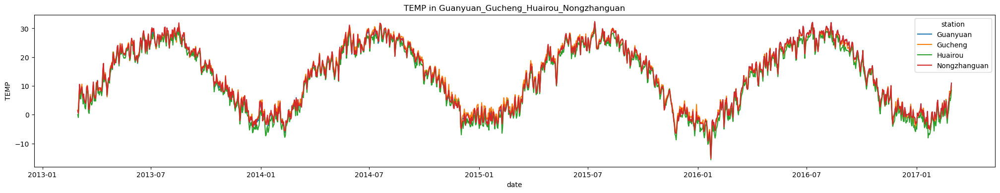

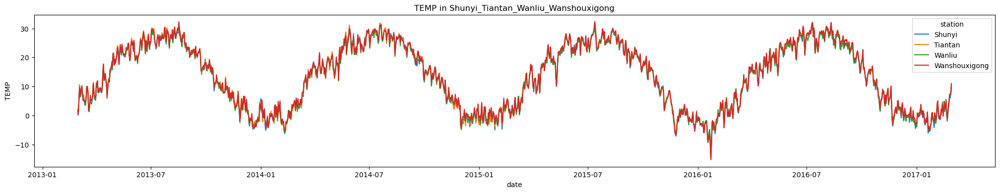

In [29]:
for key in df_merge:
    create_line_plot(df_merge[key], 'TEMP', f'TEMP in {key}')

#### PRES

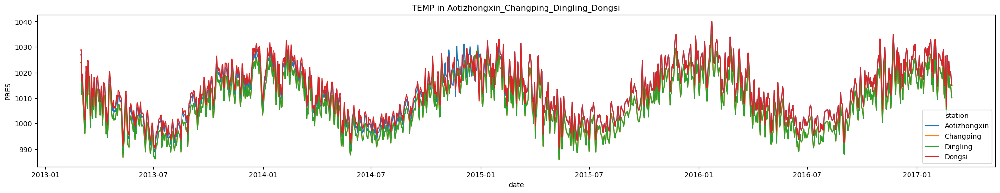

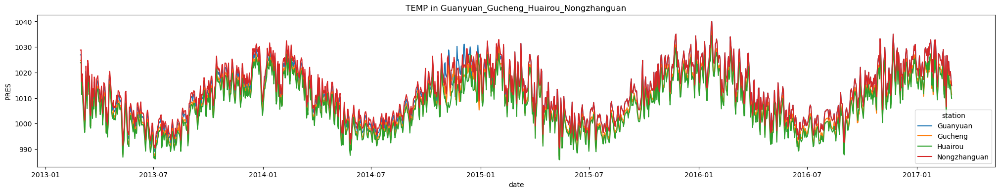

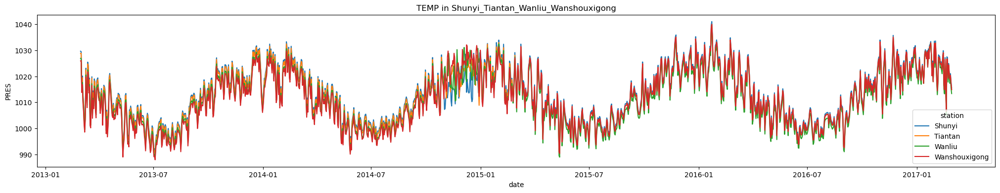

In [30]:
for key in df_merge:
    create_line_plot(df_merge[key], 'PRES', f'TEMP in {key}')

#### DEWP

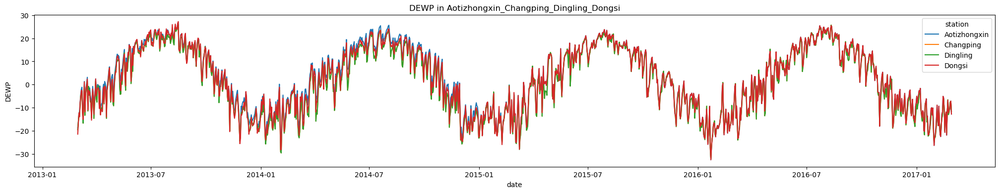

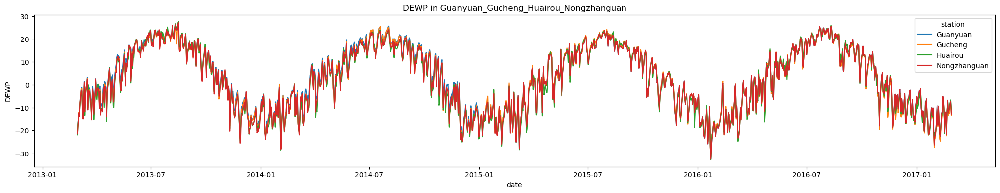

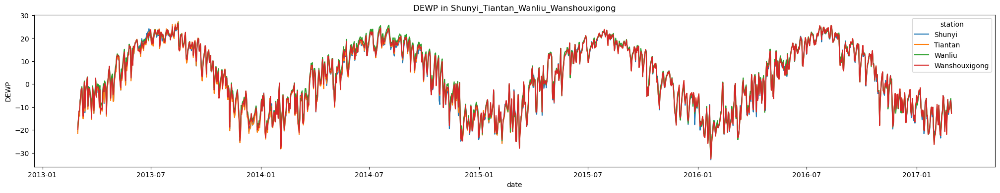

In [31]:
for key in df_merge:
    create_line_plot(df_merge[key], 'DEWP', f'DEWP in {key}')

#### RAIN

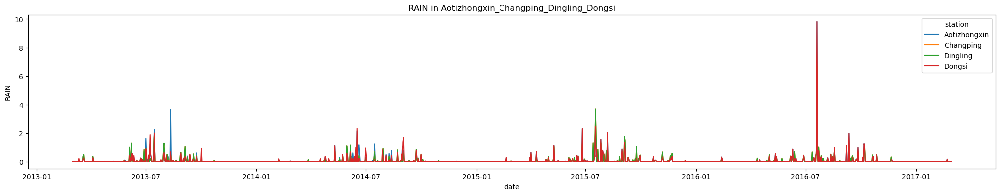

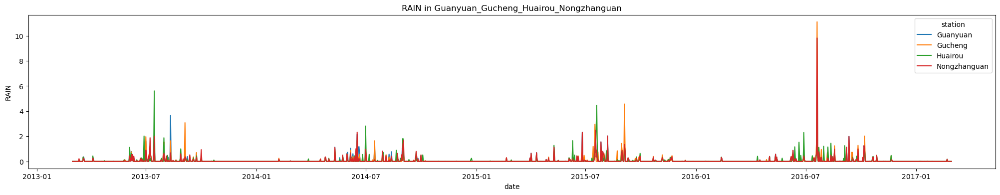

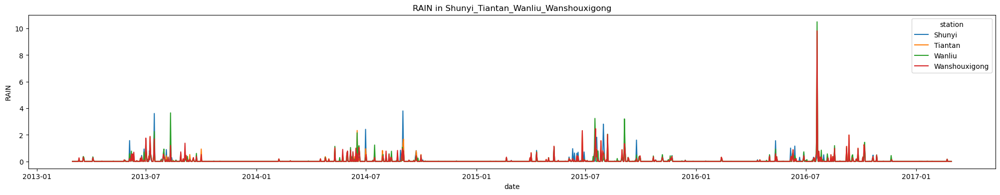

In [32]:
for key in df_merge:
    create_line_plot(df_merge[key], 'RAIN', f'RAIN in {key}')

#### WSPM

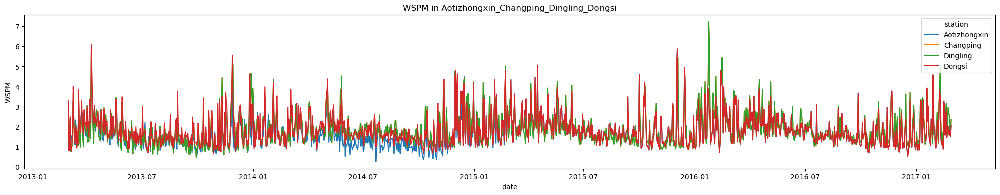

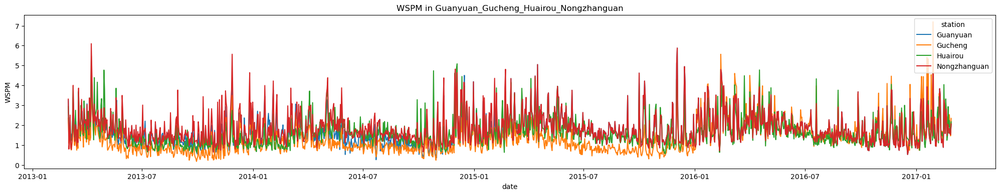

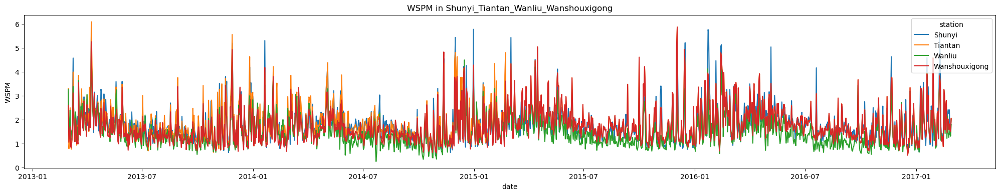

In [33]:
for key in df_merge:
    create_line_plot(df_merge[key], 'WSPM', f'WSPM in {key}')

In [46]:
season = []
for i in df_grouping['date'].dt.month:
    if i >= 4 and i <=6:
        season.append('semi')
    elif  i >=7 and i<=8:
        season.append('panas')
    elif i >= 9 and i <=10:
        season.append('gugur')
    else:
        season.append('dingin')

In [49]:
df_grouping['musim'] = season

In [61]:
df_grouping.head()

,station,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,date,musim
0,Aotizhongxin,7.125000,10.750000,11.708333,22.583333,429.166667,63.875000,1.391667,1026.875000,-18.745833,0.0,3.254167,2013-03-01,dingin
1,Changping,5.083333,18.958333,16.041667,15.333333,387.500000,77.791667,0.812500,1023.858333,-19.583333,0.0,2.133333,2013-03-01,dingin
2,Dingling,6.375000,12.853310,3.000000,19.265311,204.166667,81.958333,0.812500,1023.858333,-19.583333,0.0,2.133333,2013-03-01,dingin
3,Dongsi,6.416667,9.875000,8.897129,29.570810,434.586214,72.133777,1.325000,1028.783333,-21.466667,0.0,3.308333,2013-03-01,dingin
4,Guanyuan,7.541667,11.666667,8.500000,28.500000,400.000000,63.166667,1.391667,1026.875000,-18.745833,0.0,3.254167,2013-03-01,dingin


<Axes: xlabel='DEWP', ylabel='TEMP'>

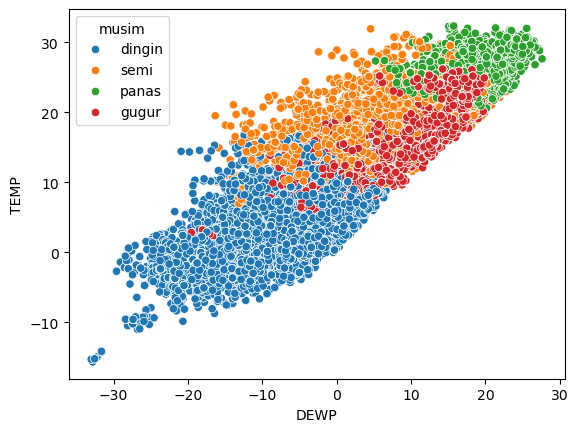

In [77]:
sns.scatterplot(data=df_grouping, x='DEWP', y='TEMP', hue='musim')

## Visualization & Explanatory Analysis

### Pertanyaan 1:
Bagaimana penyebaran PM2.5 pada station yang ada?

Berdasarkan grafik batang yang ditampilkan, terdapat variasi tingkat PM2.5 di berbagai station. Station dengan tingkat PM2.5 tertinggi adalah 'Dongsi Station'. Station dengan tingkat terendah adalah ‘Dingling Station’. Grafik ini penting karena secara visual menggambarkan data kualitas udara yang diukur dengan konsentrasi partikel PM2.5 di berbagai station pemantauan, yang dapat memiliki implikasi signifikan untuk analisis kesehatan lingkungan dan masyarakat.

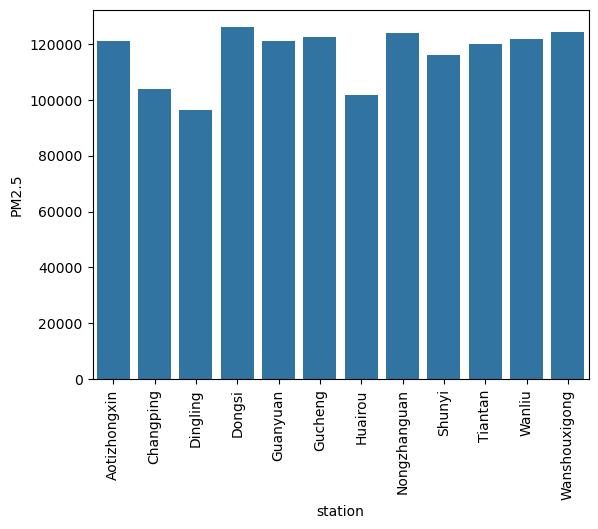

In [34]:
sns.barplot(df_grouping.groupby(by=['station'])['PM2.5'].sum().reset_index(), x="station", y="PM2.5")
plt.xticks(rotation=90)
plt.show()

### Pertanyaan 2:
Bagaimana penyebaran PM10 pada station yang ada?

Berdasarkan grafik batang yang ditampilkan, terdapat variasi tingkat PM10 di berbagai station. Station dengan tingkat PM2.5 tertinggi adalah 'Gucheng Station'. Station dengan tingkat terendah adalah ‘Dingling Station’. Grafik ini penting karena secara visual menggambarkan data kualitas udara yang diukur dengan konsentrasi partikel PM10 di berbagai station pemantauan, yang dapat memiliki implikasi signifikan untuk analisis kesehatan lingkungan dan masyarakat.

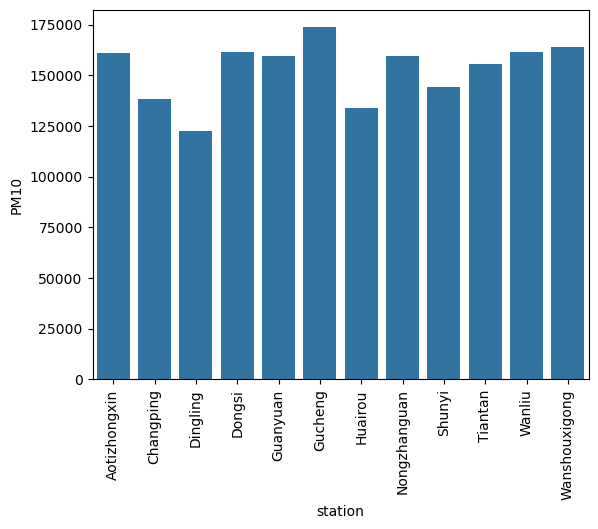

In [35]:
sns.barplot(df_grouping.groupby(by=['station'])['PM10'].sum().reset_index(), x="station", y="PM10")
plt.xticks(rotation=90)
plt.show()

### Pertanyaan 3:
Bagaimana penyebaran PM2.5 pada setiap musim?

Berdasarkan data yang dimiliki, penyebaran PM2.5 paling banyak pada musim dingin. Sementara itu penyebaran PM2.5 paling sedikit pada musim panas. 
Penyebaran PM2.5 yang lebih tinggi pada musim dingin dan lebih rendah pada musim panas dapat disebabkan oleh beberapa faktor. Berikut adalah beberapa kemungkinan penyebabnya:
- Pemanasan Rumah Tangga: Pada musim dingin, orang cenderung menggunakan pemanas rumah seperti tungku kayu, kompor, atau pemanas listrik. Proses pembakaran ini menghasilkan partikel PM2.5 yang dapat terlepas ke udara.
- Polusi Udara: Musim dingin sering kali berhubungan dengan kondisi cuaca yang lebih stabil, yang dapat menyebabkan penumpukan polutan di udara. Polusi dari kendaraan bermotor, industri, dan pembakaran bahan bakar fosil juga dapat meningkatkan konsentrasi PM2.5.
- Inversi Termal: Pada musim dingin, terjadi fenomena yang disebut inversi termal. Lapisan udara hangat di atas lapisan udara dingin menahan polutan di permukaan tanah, termasuk PM2.5. Ini mengakibatkan peningkatan konsentrasi partikel di udara.
- Aktivitas Manusia: Selama musim dingin, aktivitas manusia di dalam ruangan meningkat. Kegiatan seperti memasak, merokok, dan penggunaan produk kimia rumah tangga dapat menghasilkan partikel PM2.5.
- Kurangnya Ventilasi: Pada musim dingin, orang cenderung mengurung diri di dalam ruangan yang kurang ventilasi. Ini dapat menyebabkan penumpukan partikel PM2.5 di udara dalam ruangan.

<Axes: xlabel='musim', ylabel='SO2'>

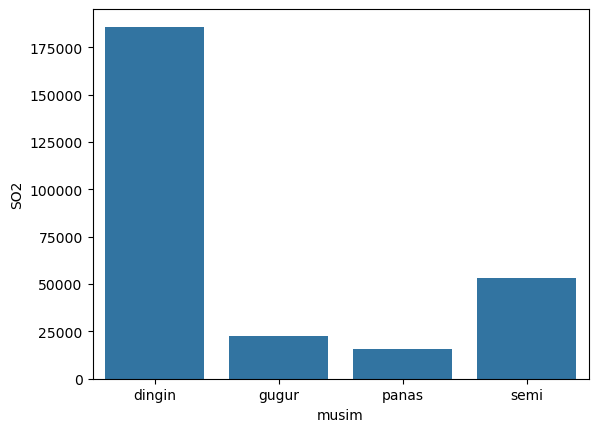

In [72]:
sns.barplot(df_grouping.groupby(by=['musim'])['SO2'].sum().reset_index(), x="musim", y="SO2")

### Pertanyaan 4:
Bagaimana pengaruh SO2 terhadap suhu lingkungan?

Berdasarkan data yang dimiliki, berikut analisis pengaruh S02:
- Hubungan Suhu dan SO2: Data menunjukkan bahwa suhu yang lebih tinggi berkorelasi dengan konsentrasi SO2 yang lebih rendah, terutama selama musim panas.
- Efek Pendinginan: SO2 dikenal memiliki efek pendinginan karena dapat membentuk partikel yang memantulkan sinar matahari.
- Faktor Musiman: Perubahan musiman dapat mempengaruhi tingkat SO2 di atmosfer, yang juga mempengaruhi suhu.
- Kesimpulan: Meskipun grafik menunjukkan hubungan, tidak dapat dipastikan apakah SO2 secara langsung menyebabkan perubahan suhu tanpa data tambahan.
Perlu diperhatikan bahwa untuk menentukan kausalitas, diperlukan analisis lebih lanjut dengan data yang lebih komprehensif.

<Axes: xlabel='TEMP', ylabel='SO2'>

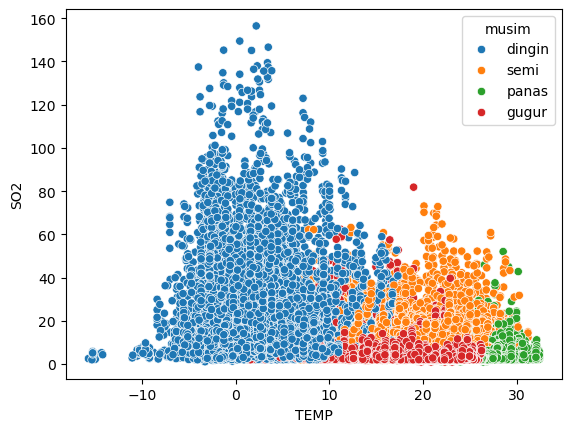

In [79]:
sns.scatterplot(data=df_grouping, x='TEMP', y='SO2', hue='musim')

## Conclusion

Berdasarkan grafik batang yang ditampilkan, terdapat variasi tingkat PM2.5 di berbagai station. Station dengan tingkat PM2.5 tertinggi adalah 'Dongsi Station'. Station dengan tingkat terendah adalah ‘Dingling Station’. Grafik ini penting karena secara visual menggambarkan data kualitas udara yang diukur dengan konsentrasi partikel PM2.5 di berbagai station pemantauan, yang dapat memiliki implikasi signifikan untuk analisis kesehatan lingkungan dan masyarakat.

Berdasarkan grafik batang yang ditampilkan, terdapat variasi tingkat PM10 di berbagai station. Station dengan tingkat PM2.5 tertinggi adalah 'Gucheng Station'. Station dengan tingkat terendah adalah ‘Dingling Station’. Grafik ini penting karena secara visual menggambarkan data kualitas udara yang diukur dengan konsentrasi partikel PM10 di berbagai station pemantauan, yang dapat memiliki implikasi signifikan untuk analisis kesehatan lingkungan dan masyarakat.

Berdasarkan data yang dimiliki, penyebaran PM2.5 paling banyak pada musim dingin. Sementara itu penyebaran PM2.5 paling sedikit pada musim panas. 
Penyebaran PM2.5 yang lebih tinggi pada musim dingin dan lebih rendah pada musim panas dapat disebabkan oleh beberapa faktor. Berikut adalah beberapa kemungkinan penyebabnya:
- Pemanasan Rumah Tangga: Pada musim dingin, orang cenderung menggunakan pemanas rumah seperti tungku kayu, kompor, atau pemanas listrik. Proses pembakaran ini menghasilkan partikel PM2.5 yang dapat terlepas ke udara.
- Polusi Udara: Musim dingin sering kali berhubungan dengan kondisi cuaca yang lebih stabil, yang dapat menyebabkan penumpukan polutan di udara. Polusi dari kendaraan bermotor, industri, dan pembakaran bahan bakar fosil juga dapat meningkatkan konsentrasi PM2.5.
- Inversi Termal: Pada musim dingin, terjadi fenomena yang disebut inversi termal. Lapisan udara hangat di atas lapisan udara dingin menahan polutan di permukaan tanah, termasuk PM2.5. Ini mengakibatkan peningkatan konsentrasi partikel di udara.
- Aktivitas Manusia: Selama musim dingin, aktivitas manusia di dalam ruangan meningkat. Kegiatan seperti memasak, merokok, dan penggunaan produk kimia rumah tangga dapat menghasilkan partikel PM2.5.
- Kurangnya Ventilasi: Pada musim dingin, orang cenderung mengurung diri di dalam ruangan yang kurang ventilasi. Ini dapat menyebabkan penumpukan partikel PM2.5 di udara dalam ruangan.

Berdasarkan data yang dimiliki, berikut analisis pengaruh S02:
- Hubungan Suhu dan SO2: Data menunjukkan bahwa suhu yang lebih tinggi berkorelasi dengan konsentrasi SO2 yang lebih rendah, terutama selama musim panas.
- Efek Pendinginan: SO2 dikenal memiliki efek pendinginan karena dapat membentuk partikel yang memantulkan sinar matahari.
- Faktor Musiman: Perubahan musiman dapat mempengaruhi tingkat SO2 di atmosfer, yang juga mempengaruhi suhu.
- Kesimpulan: Meskipun grafik menunjukkan hubungan, tidak dapat dipastikan apakah SO2 secara langsung menyebabkan perubahan suhu tanpa data tambahan.
Perlu diperhatikan bahwa untuk menentukan kausalitas, diperlukan analisis lebih lanjut dengan data yang lebih komprehensif.